In [139]:
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score
from sklearn.metrics import plot_confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from sklearn.svm import SVC

In [171]:
from sklearn.ensemble import RandomForestClassifier

In [2]:
data_frame = pd.read_csv("water_potability.csv")

In [3]:
print(data_frame.shape)

(3276, 10)


In [4]:
data_frame.head(5)

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [5]:
data_labels = data_frame["Potability"]
features = data_frame.drop("Potability" , axis = 1)

In [6]:
print(features.shape)
print(data_labels.shape)

(3276, 9)
(3276,)


In [7]:
### splitting the data_frame in train_data and test_data

In [20]:
x_train , x_test , y_train , y_test =train_test_split( features , data_labels , test_size = 0.3) 

In [21]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(2293, 9)
(983, 9)
(2293,)
(983,)


In [22]:
#### now lets focus on x_train

In [23]:
### lets see if the columns of x_train has null values or not

In [24]:
x_train.isnull().sum()

ph                 340
Hardness             0
Solids               0
Chloramines          0
Sulfate            551
Conductivity         0
Organic_carbon       0
Trihalomethanes    121
Turbidity            0
dtype: int64

In [25]:
#### we have following methods of filling the nan_values

In [26]:
### 1 drop rows or columns with NAN values
### 2 fill with mean() , median() , most frequent
### 3 fill missing_values with std imputation methods create another feature for missing values 
### 4 use models or knn to predict missing values
### 5 use deeplearning liberary "Datawig" to fill nan values

In [27]:
### first using filling with median

In [28]:
imputer = SimpleImputer( missing_values = np.nan , strategy = "mean" )
imputer.fit(x_train)
x_train = imputer.transform(x_train)

In [29]:
### now filling nan values of test dataset

In [30]:
imputer = SimpleImputer(missing_values = np.nan , strategy = "mean")
imputer.fit(x_test)
x_test = imputer.transform(x_test)

In [33]:
x_train[:5][:]

array([[7.28616739e+00, 2.08444085e+02, 3.08790267e+04, 6.85696713e+00,
        3.36048832e+02, 3.52602146e+02, 1.05664520e+01, 6.40253328e+01,
        4.68601992e+00],
       [9.90193059e+00, 2.06746469e+02, 1.31806778e+04, 5.87883463e+00,
        3.33926676e+02, 4.26534807e+02, 1.43218737e+01, 7.54087541e+01,
        4.22694955e+00],
       [7.14912457e+00, 2.02582542e+02, 2.31583891e+04, 6.06781201e+00,
        3.02002743e+02, 3.01984240e+02, 1.76225948e+01, 4.22927665e+01,
        3.78703341e+00],
       [6.72718527e+00, 1.97439216e+02, 2.60124887e+04, 6.95200803e+00,
        3.46628735e+02, 4.73330078e+02, 1.84378353e+01, 6.94662891e+01,
        4.15824853e+00],
       [6.18969926e+00, 2.24432949e+02, 1.52297029e+04, 5.87918385e+00,
        3.66501118e+02, 6.49805765e+02, 1.02575147e+01, 7.17809493e+01,
        3.02737148e+00]])

In [34]:
#### now training a logistic regression model to see what happens

In [35]:
x_train = ( x_train - x_train.mean() ) / x_train.std()
x_test = ( x_test - x_test.mean() ) / x_test.std()

In [37]:
x_train[:5][:]

array([[-0.34236733, -0.31538181,  3.79910554, -0.34242491, -0.29826351,
        -0.29604287, -0.34192728, -0.33475572, -0.34271615],
       [-0.34201643, -0.31560955,  1.42485548, -0.34255613, -0.2985482 ,
        -0.28612474, -0.34142349, -0.33322862, -0.34277773],
       [-0.34238572, -0.31616814,  2.76337478, -0.34253078, -0.30283083,
        -0.30283331, -0.34098069, -0.33767117, -0.34283675],
       [-0.34244232, -0.31685812,  3.14625492, -0.34241216, -0.29684421,
        -0.27984711, -0.34087133, -0.33402581, -0.34278695],
       [-0.34251443, -0.31323689,  1.69973411, -0.34255608, -0.29417831,
        -0.25617273, -0.34196872, -0.3337153 , -0.34293865]])

In [38]:
model = LogisticRegression(max_iter = 1000)
model.fit(x_train , y_train)
preicted_y = model.predict(x_test)

0.6073245167853509


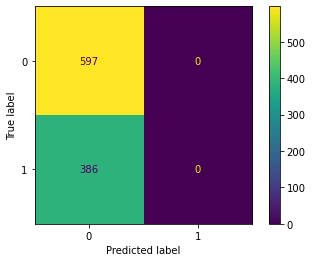

In [39]:
print(accuracy_score(y_test , preicted_y))
plot_confusion_matrix(model ,x_test , y_test  )

In [40]:
y_test.value_counts()

0    597
1    386
Name: Potability, dtype: int64

In [41]:
preicted_y = preicted_y.ravel()

In [42]:
np.unique(preicted_y , return_counts = True)

(array([0], dtype=int64), array([983], dtype=int64))

In [43]:
#### training KNN model to see if accuracy increases

In [44]:
params = { "n_neighbors" : [ 5, 10 , 30 , 50 , 100 , 200 ,300 ,500 , 800] , "p" : [1,2] }

estimator = KNeighborsClassifier()
model2 = GridSearchCV(estimator , param_grid = params)
model2.fit(x_train , y_train)

GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [5, 10, 30, 50, 100, 200, 300, 500,
                                         800],
                         'p': [1, 2]})

In [45]:
model2.best_params_

{'n_neighbors': 100, 'p': 1}

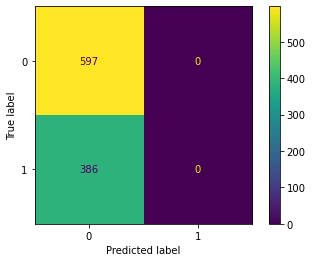

In [46]:
estimator = KNeighborsClassifier(n_neighbors = 200 , p = 1)
estimator.fit(x_train , y_train)
predicted_y = estimator.predict(x_test)
accuracy = accuracy_score( y_test , predicted_y)
plot_confusion_matrix( estimator , x_test , y_test)

In [47]:
### now visualising the train data in 2D

In [48]:
tsne = TSNE( n_components = 2 , perplexity = 10)

train_2d = tsne.fit_transform( x_train )
train_3d = np.vstack((train_2d.T,y_train)).T
train_dataframe = pd.DataFrame(train_3d , columns = ["c1" , "c2" , "labels"])

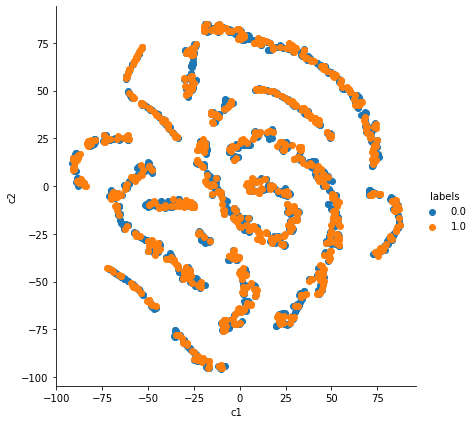

In [49]:
sns.FacetGrid(train_dataframe , hue = "labels" , height = 6).map(plt.scatter , "c1" , "c2").add_legend()

In [50]:
### pairplot of train data

train_data , test_data = train_test_split( data_frame , test_size = 0.3)

In [51]:
print(train_data.shape)
print(test_data.shape)

(2293, 10)
(983, 10)


In [52]:
imputer = SimpleImputer( missing_values = np.nan , strategy = "mean" )
imputer.fit( train_data )
train_data = imputer.transform( train_data )

In [53]:
train_data = ( train_data - train_data.mean() ) / train_data.std()

In [54]:
train_dataframe = pd.DataFrame( train_data , columns = data_frame.columns)

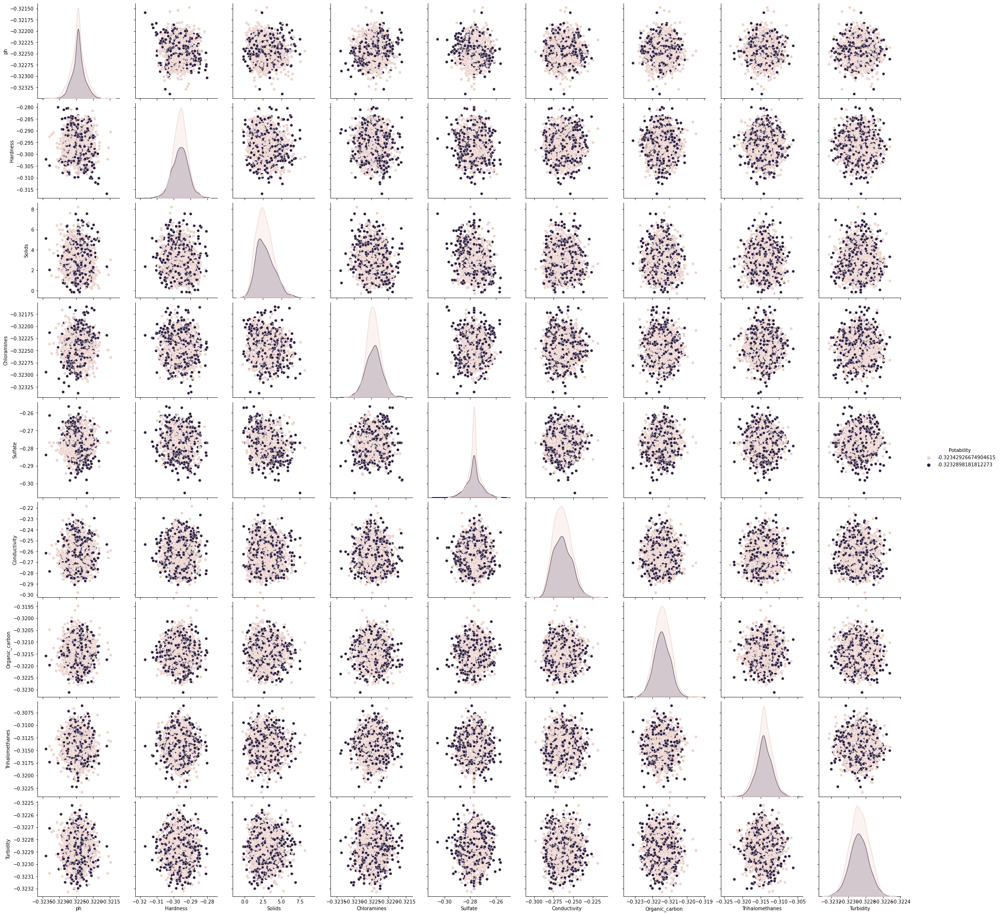

In [55]:
sns.pairplot( train_dataframe , hue = "Potability"  , height = 3)

In [56]:
###  totally overlaps

In [57]:
### lets try putting dropping NAN values columns

In [59]:
##3 lets drop ph,sulphate and trihalomethanes

In [60]:
features = [ "Hardness" , "Solids" , "Chloramines" , "Conductivity" , "Organic_carbon" , "Turbidity" ]

In [62]:
x_train , x_test = train_test_split( data_frame , test_size = 0.3)

In [63]:
x_train = x_train[features]
x_test = x_test[features]

In [64]:
x_train_p = x_train
x_train_p["Potability"] = y_train

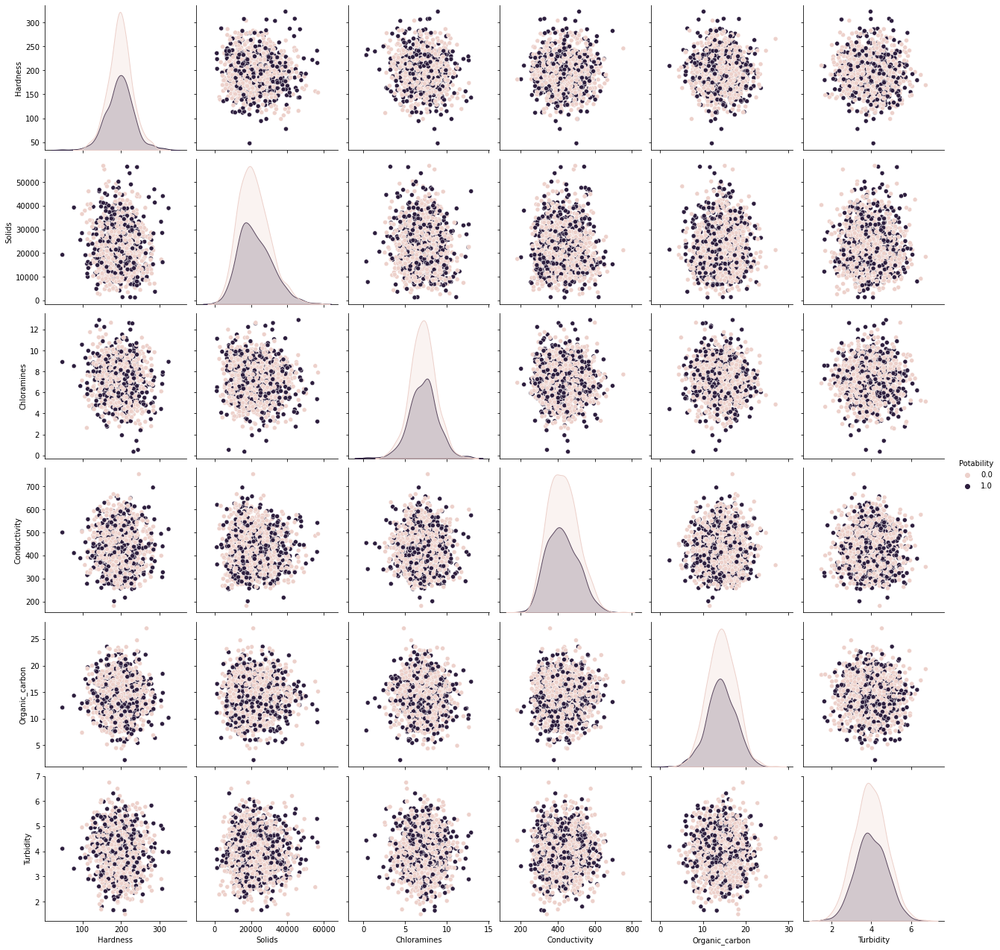

In [65]:
sns.pairplot(x_train_p , hue = "Potability" , height = 3)

In [100]:
data_frame_final = data_frame.copy()

In [101]:
data_frame_final = data_frame_final.drop("Sulfate" , axis = 1)
data_frame_final = data_frame_final.drop("Trihalomethanes" , axis = 1)

In [102]:
data_frame_final = data_frame_final.drop("Potability" , axis = 1)

In [103]:
data_frame_final.head(5)

,ph,Hardness,Solids,Chloramines,Conductivity,Organic_carbon,Turbidity
0,NaN,204.890455,20791.318981,7.300212,564.308654,10.379783,2.963135
1,3.716080,129.422921,18630.057858,6.635246,592.885359,15.180013,4.500656
2,8.099124,224.236259,19909.541732,9.275884,418.606213,16.868637,3.055934
3,8.316766,214.373394,22018.417441,8.059332,363.266516,18.436524,4.628771
4,9.092223,181.101509,17978.986339,6.546600,398.410813,11.558279,4.075075


In [104]:
data_frame_final.shape

(3276, 7)

In [105]:
data_frame_final.isnull().sum()

ph                491
Hardness            0
Solids              0
Chloramines         0
Conductivity        0
Organic_carbon      0
Turbidity           0
dtype: int64

In [106]:
### we can see that ph has 491 null values with 
### what we are gonna do is we are going to fill the nan values with median and add another column for null values

ph_mean = data_frame_final.ph.mean()


In [107]:
ph_mean

7.080794504276821

In [108]:
list1 = data_frame_final.ph.isnull()

In [109]:
list1

0        True
1       False
2       False
3       False
4       False
        ...  
3271    False
3272    False
3273    False
3274    False
3275    False
Name: ph, Length: 3276, dtype: bool

In [110]:
list2 = []
for i in range(0,3276):
    if( list1[i] == True ):
        list2.append(1)
    elif( list1[i] == False ):
        list2.append(0)

In [111]:
list2[:5]

[1, 0, 0, 0, 0]

In [112]:
data_frame_final.shape

(3276, 7)

In [113]:
data_frame_final.ph.fillna(value = ph_mean , inplace = True)

In [114]:
data_frame_final["ph"][0]

7.080794504276821

In [115]:
data_frame_final.head(5)

,ph,Hardness,Solids,Chloramines,Conductivity,Organic_carbon,Turbidity
0,7.080795,204.890455,20791.318981,7.300212,564.308654,10.379783,2.963135
1,3.716080,129.422921,18630.057858,6.635246,592.885359,15.180013,4.500656
2,8.099124,224.236259,19909.541732,9.275884,418.606213,16.868637,3.055934
3,8.316766,214.373394,22018.417441,8.059332,363.266516,18.436524,4.628771
4,9.092223,181.101509,17978.986339,6.546600,398.410813,11.558279,4.075075


In [86]:
##data_frame_final2 = (data_frame_final - data_frame_final.mean()) / data_frame_final.std()

In [91]:
##data_frame_final2["ph2"].value_counts()

0    2785
1     491
Name: ph2, dtype: int64

In [92]:
##data_frame_final = (data_frame_final - data_frame_final.mean()) / data_frame_final.std()

In [93]:
##data_frame_final2["Protability"] = data_labels

In [116]:
##sns.pairplot(data_frame_final2 , hue = "Protability" , height = 3)

In [95]:
### now performing same operations on sulfate and Trihalomethanes

In [98]:
list3_ = data_frame.Sulfate.isnull()
list3 = []
for i in range(0,3276):
    if(list3_[i] == True ):
        list3.append(1)
    elif( list3_[i] == False ):
        list3.append(0)

In [117]:
data_frame_final["Sulfate"] = data_frame["Sulfate"] 

In [120]:
data_frame_final.Sulfate.fillna(value = data_frame_final.Sulfate.mean() , inplace = True)

In [121]:
list4_ = data_frame.Trihalomethanes.isnull()
list4 = []
for i in range(0,3276):
    if(list4_[i] == True ):
        list4.append(1)
    elif( list4_[i] == False ):
        list4.append(0)

In [122]:
data_frame_final["Trihalomethanes"] = data_frame["Trihalomethanes"] 
data_frame_final.Trihalomethanes.fillna(value = data_frame_final.Trihalomethanes.mean() , inplace = True)

In [123]:
data_frame_final.isnull().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Conductivity       0
Organic_carbon     0
Turbidity          0
Sulfate            0
Trihalomethanes    0
dtype: int64

In [124]:
data_frame_final.head(5)

,ph,Hardness,Solids,Chloramines,Conductivity,Organic_carbon,Turbidity,Sulfate,Trihalomethanes
0,7.080795,204.890455,20791.318981,7.300212,564.308654,10.379783,2.963135,368.516441,86.990970
1,3.716080,129.422921,18630.057858,6.635246,592.885359,15.180013,4.500656,333.775777,56.329076
2,8.099124,224.236259,19909.541732,9.275884,418.606213,16.868637,3.055934,333.775777,66.420093
3,8.316766,214.373394,22018.417441,8.059332,363.266516,18.436524,4.628771,356.886136,100.341674
4,9.092223,181.101509,17978.986339,6.546600,398.410813,11.558279,4.075075,310.135738,31.997993


In [125]:
data_frame_final2 = data_frame_final.copy()

In [127]:
##now what we are doing is in data_frame_final2 we will first normalize the columns then add list2 , list3 , list4 as other 
##columns and in data_frame_final we will add other columns then normalize

In [128]:
data_frame_final2 = ( data_frame_final2 - data_frame_final2.mean() ) / data_frame_final2.std()

In [129]:
data_frame_final2["ph2"] = list2
data_frame_final2["Sulphate2"] = list3
data_frame_final2["Trihalomethane"] = list4

In [130]:
data_frame_final2.head(5)

,ph,Hardness,Solids,Chloramines,Conductivity,Organic_carbon,Turbidity,Sulfate,Trihalomethanes,ph2,Sulphate2,Trihalomethane
0,4.048281e-14,0.259155,-0.139450,0.112398,1.708693,-1.180470,-1.286101,9.612107e-01,1.305950,1,0,0
1,-2.288990e+00,-2.036103,-0.385928,-0.307647,2.062260,0.270556,0.684113,-3.460058e-14,-0.638383,0,1,0
2,6.927620e-01,0.847535,-0.240011,1.360386,-0.094018,0.780998,-1.167187,-3.460058e-14,0.001509,0,1,0
3,8.408220e-01,0.547568,0.000493,0.591917,-0.778711,1.254943,0.848282,6.394214e-01,2.152545,0,0,0
4,1.368360e+00,-0.464358,-0.460178,-0.363642,-0.343886,-0.824231,0.138764,-6.540767e-01,-2.181266,0,0,0


In [131]:
data_frame_final["ph2"] = list2
data_frame_final["Sulphate2"] = list3
data_frame_final["Trihalomethane"] = list4

data_frame_final = ( data_frame_final - data_frame_final.mean() ) / data_frame_final.std()

In [132]:
data_frame_final.head(5)

,ph,Hardness,Solids,Chloramines,Conductivity,Organic_carbon,Turbidity,Sulfate,Trihalomethanes,ph2,Sulphate2,Trihalomethane
0,4.048281e-14,0.259155,-0.139450,0.112398,1.708693,-1.180470,-1.286101,9.612107e-01,1.305950,2.381253,-0.559402,-0.228051
1,-2.288990e+00,-2.036103,-0.385928,-0.307647,2.062260,0.270556,0.684113,-3.460058e-14,-0.638383,-0.419819,1.787078,-0.228051
2,6.927620e-01,0.847535,-0.240011,1.360386,-0.094018,0.780998,-1.167187,-3.460058e-14,0.001509,-0.419819,1.787078,-0.228051
3,8.408220e-01,0.547568,0.000493,0.591917,-0.778711,1.254943,0.848282,6.394214e-01,2.152545,-0.419819,-0.559402,-0.228051
4,1.368360e+00,-0.464358,-0.460178,-0.363642,-0.343886,-0.824231,0.138764,-6.540767e-01,-2.181266,-0.419819,-0.559402,-0.228051


In [133]:
### now lets see is any of the two data frames works

In [184]:
x_train , x_test , y_train , y_test = train_test_split( data_frame_final , data_labels , test_size = 0.3 )

In [135]:
x_train2 , x_test2 , y_train2 , y_test2 = train_test_split( data_frame_final2 , data_labels , test_size = 0.3 )

0.6103763987792472


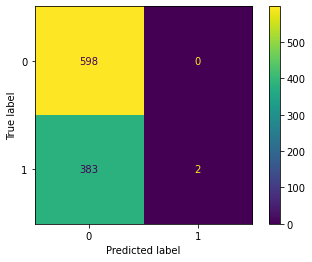

In [136]:
model = LogisticRegression(max_iter = 1000)
model.fit(x_train , y_train)
preicted_y = model.predict(x_test)

print(accuracy_score(y_test , preicted_y))
plot_confusion_matrix(model ,x_test , y_test  )

0.5940996948118006


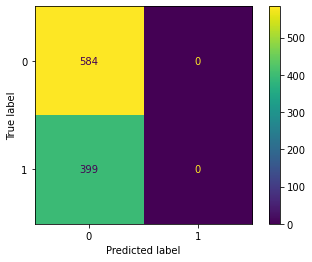

In [137]:
model = LogisticRegression(max_iter = 1000)
model.fit(x_train2 , y_train2)
preicted_y2 = model.predict(x_test2)

print(accuracy_score(y_test2 , preicted_y2))
plot_confusion_matrix(model ,x_test2 , y_test2  )

In [138]:
###3 training a support vector classifier

In [144]:
params = { "C" : [ 0.5 , 1 , 2 , 5 , 10 ] , "kernel" : [ "linear", "poly", "rbf" ] , "gamma" : [ "scale" , "auto" ]}

In [146]:
estimator = SVC()
model = GridSearchCV( estimator , param_grid = params )
model.fit( x_train , y_train )

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.5, 1, 2, 5, 10], 'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'rbf']})

In [150]:
model.best_params_

{'C': 2, 'gamma': 'auto', 'kernel': 'rbf'}

In [152]:
estimator = SVC( C = 2 , gamma = 'auto' , kernel = "rbf")
estimator.fit( x_train , y_train )
predicted_y = estimator.predict(x_test)

In [153]:
print(accuracy_score(predicted_y , y_test))

0.659206510681587


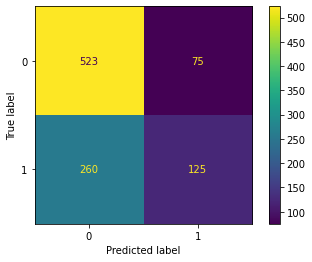

In [154]:
plot_confusion_matrix( estimator , x_test , y_test )

In [155]:
#### now training_svc on x_train2 , y_train2

In [156]:
params = { "C" : [ 0.5 , 1 , 2 , 5 , 10 ] , "kernel" : [ "linear", "poly", "rbf" ] , "gamma" : [ "scale" , "auto" ]}
estimator = SVC()
model = GridSearchCV( estimator , param_grid = params )
model.fit( x_train2 , y_train2 )

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.5, 1, 2, 5, 10], 'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'rbf']})

In [157]:
model.best_params_

{'C': 1, 'gamma': 'scale', 'kernel': 'rbf'}

0.6541200406917599


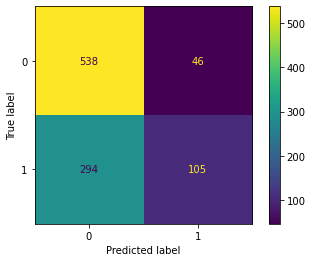

In [158]:
estimator = SVC( C = 1 , gamma = 'scale' , kernel = "rbf")
estimator.fit( x_train2 , y_train2 )
predicted_y = estimator.predict(x_test2 ) 

print(accuracy_score(predicted_y , y_test2))
plot_confusion_matrix( estimator , x_test2 , y_test2 )

In [159]:
### the best accuracy we have reached is ~66% now lets plot them pairwise

In [164]:
datax = x_train.copy()

In [165]:
datax["Protability"] = y_train

In [166]:
datax.head(5)

,ph,Hardness,Solids,Chloramines,Conductivity,Organic_carbon,Turbidity,Sulfate,Trihalomethanes,ph2,Sulphate2,Trihalomethane,Protability
2413,0.457933,0.721684,-0.552485,0.544356,-0.509256,0.774914,1.110021,0.286258,-1.229747,-0.419819,-0.559402,-0.228051,1
414,-1.009667,-0.582599,-0.466295,0.829515,1.560223,-1.192500,1.625261,-0.831196,-0.543801,-0.419819,-0.559402,-0.228051,0
1087,0.051451,0.049393,0.571486,-0.244933,0.275315,-0.535946,-1.292150,0.717567,-1.084120,-0.419819,-0.559402,-0.228051,1
1497,1.096873,0.693703,-0.622019,1.108427,1.472625,-2.116570,0.923984,0.595674,0.439777,-0.419819,-0.559402,-0.228051,1
275,-1.194493,2.546252,1.520267,3.740500,-0.417990,-1.142674,0.589905,-4.248974,-0.717293,-0.419819,-0.559402,-0.228051,1


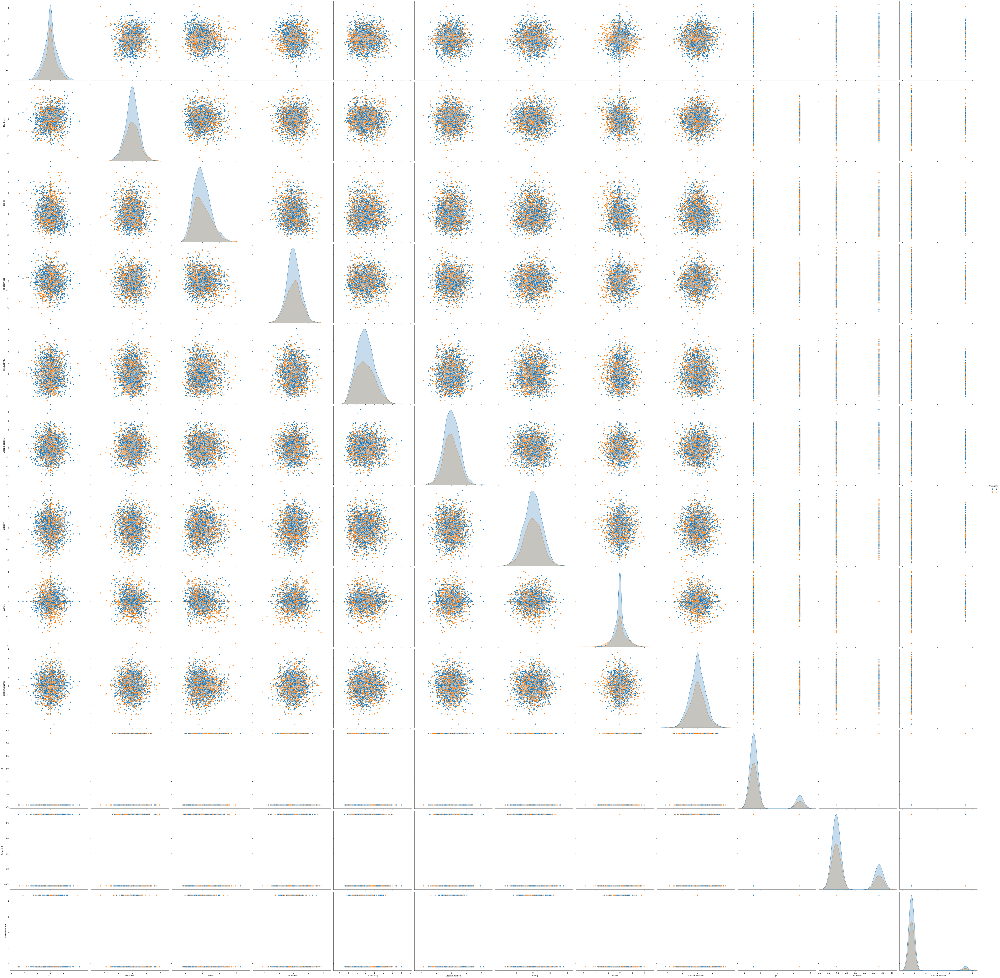

In [168]:
sns.pairplot(datax , hue = "Protability" ,height = 6)

In [169]:
### training_a random forest on this dataset


In [175]:
params = {"n_estimators": [ 50 , 100 , 150 , 200 , 250 ] , "criterion" : [ "gini" , "entropy" ]}
estimator = RandomForestClassifier()
model = GridSearchCV( estimator , param_grid = params)
model.fit(x_train , y_train)

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'n_estimators': [50, 100, 150, 200, 250]})

In [176]:
model.best_params_

{'criterion': 'entropy', 'n_estimators': 200}

accuracy is 0.6541200406917599


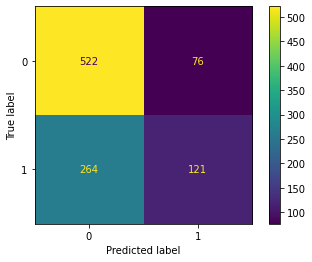

In [180]:
estimator = RandomForestClassifier( n_estimators = 200 , criterion = "gini" )
estimator.fit( x_train , y_train )
predicted_y = estimator.predict(x_test)

accuracy = accuracy_score( y_test , predicted_y)
print("accuracy is {}".format(accuracy))
plot_confusion_matrix(estimator , x_test , y_test)

accuracy is 0.6581892166836215


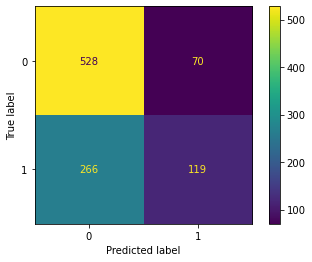

In [181]:
### changing criterion will not give much difference but lets give a try

estimator = RandomForestClassifier( n_estimators = 200 , criterion = "entropy" )
estimator.fit( x_train , y_train )
predicted_y = estimator.predict(x_test)

accuracy = accuracy_score( y_test , predicted_y)
print("accuracy is {}".format(accuracy))
plot_confusion_matrix(estimator , x_test , y_test)

In [189]:
### lets train randomforestmodel on unprocessed data 
features2 = ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity']
data_3 = data_frame[features2]

x_train3 , x_test3 , y_train3 , y_test3 = train_test_split( data_3 , data_labels , test_size = 0.3 )

In [190]:
print(x_train3.shape)
print(x_test3.shape)
print(y_train3.shape)
print(y_test3.shape)

(2293, 9)
(983, 9)
(2293,)
(983,)


In [191]:
x_train3 = pd.get_dummies(x_train3 )
x_test3 = pd.get_dummies(x_test3)

In [192]:
print(x_train3.shape)
print(x_test3.shape)

(2293, 9)
(983, 9)


In [194]:
x_train3.isnull().sum()

ph                 340
Hardness             0
Solids               0
Chloramines          0
Sulfate            536
Conductivity         0
Organic_carbon       0
Trihalomethanes    100
Turbidity            0
dtype: int64

In [200]:
x_train3.fillna(value = x_train3.mean() , inplace = True )
x_test3.fillna(value = x_test3.mean() , inplace = True )

In [206]:
params = {"n_estimators": [ 50 , 100 , 150 , 200 , 250 ] , "criterion" : [ "gini" , "entropy" ] , "max_depth" : [6,7,8,9]}
estimator = RandomForestClassifier()
model = GridSearchCV( estimator , param_grid = params)
model.fit(x_train3 , y_train3)

model.best_params_

{'criterion': 'gini', 'max_depth': 9, 'n_estimators': 250}

accuracy is 0.659206510681587


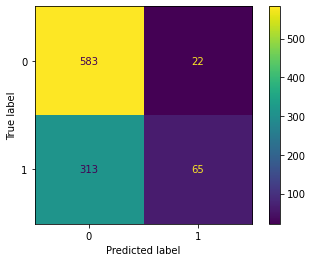

In [207]:
estimator = RandomForestClassifier( n_estimators = 150 , criterion = "entropy" ,max_depth = 9)
estimator.fit( x_train3 , y_train3 )
predicted_y = estimator.predict(x_test3)

accuracy = accuracy_score( y_test3 , predicted_y )
print("accuracy is {}".format(accuracy))
plot_confusion_matrix(estimator , x_test3 , y_test3)

In [182]:
######## now lets train XGboost and Adaboost

In [213]:
with open("featurised_data.csv" , "w") as file:
    data_frame_final.to_csv(file , index = False)